In [3]:
import numpy as np
import matplotlib.pyplot as plt
import cv2 as cv
import os
import time
import math

%load_ext Cython

The Cython extension is already loaded. To reload it, use:
  %reload_ext Cython


In [5]:
#v=list(os.walk('./zdjs/light_set'))
v=list(os.walk('./zdjs/Trivial'))

f=[0]*200
j=0
for i in range(0, len(v)):
    for x in (v[i][2]):
        f[j]=cv.imread(v[i][0]+'/'+x, cv.IMREAD_GRAYSCALE)
        j+=1
        
def grave(img, biw=0):
    fig, ax=plt.subplots(1,1,figsize=(22,22))
    if (biw==1):
        ax.imshow(img, cmap='Greys',  interpolation='nearest')
    else:
        ax.imshow(img)
    plt.show()

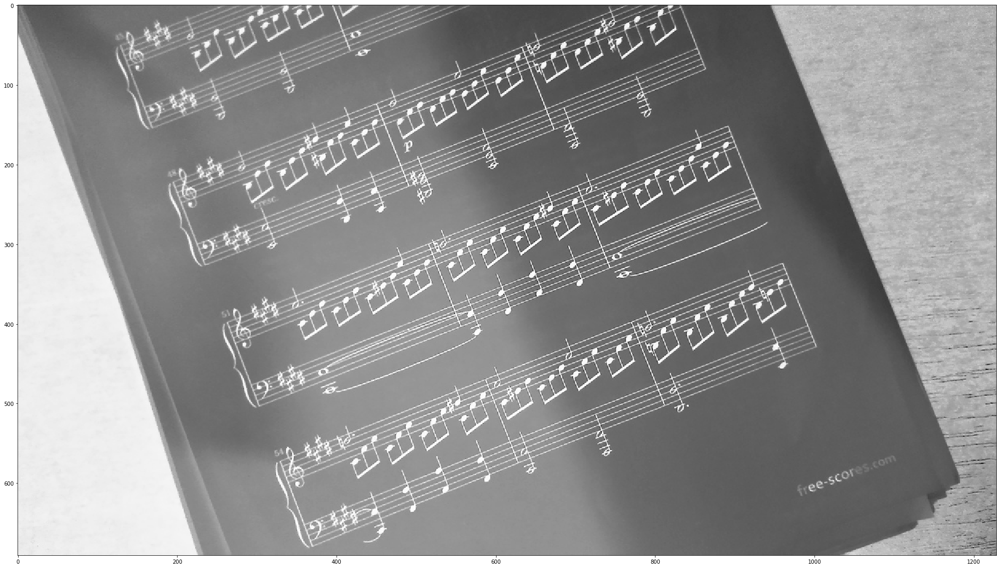

0.3502781315900847


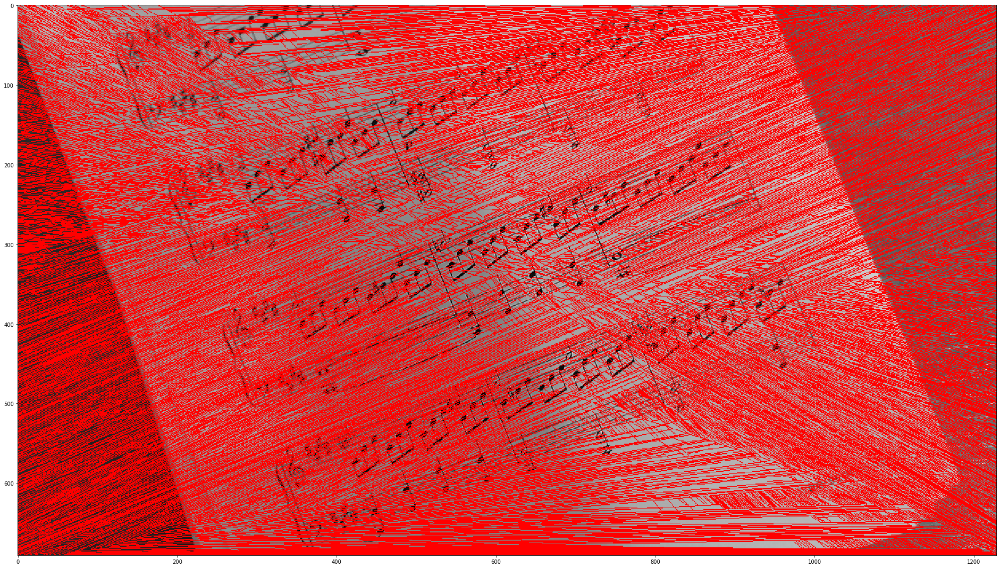

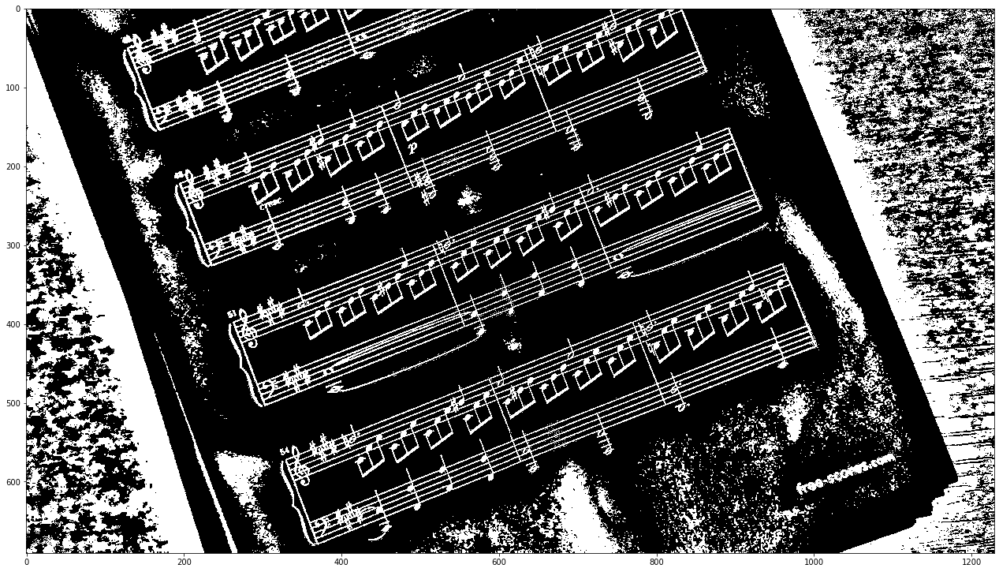

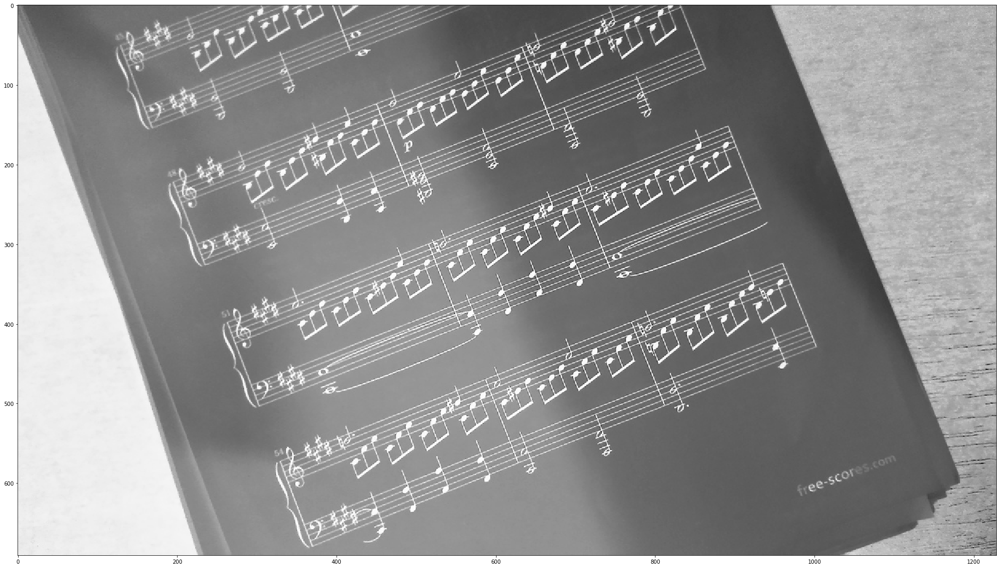

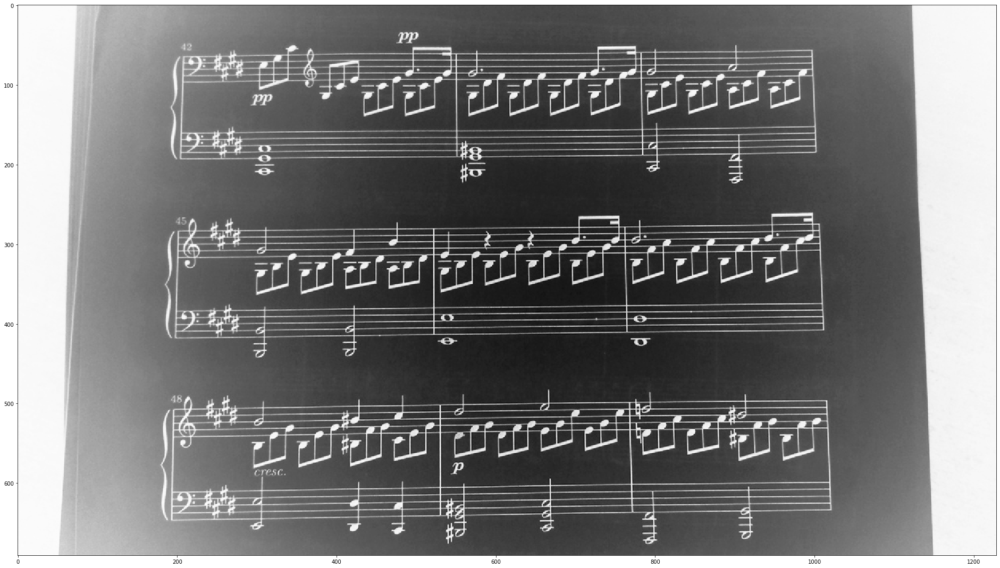

0.13022148917210993


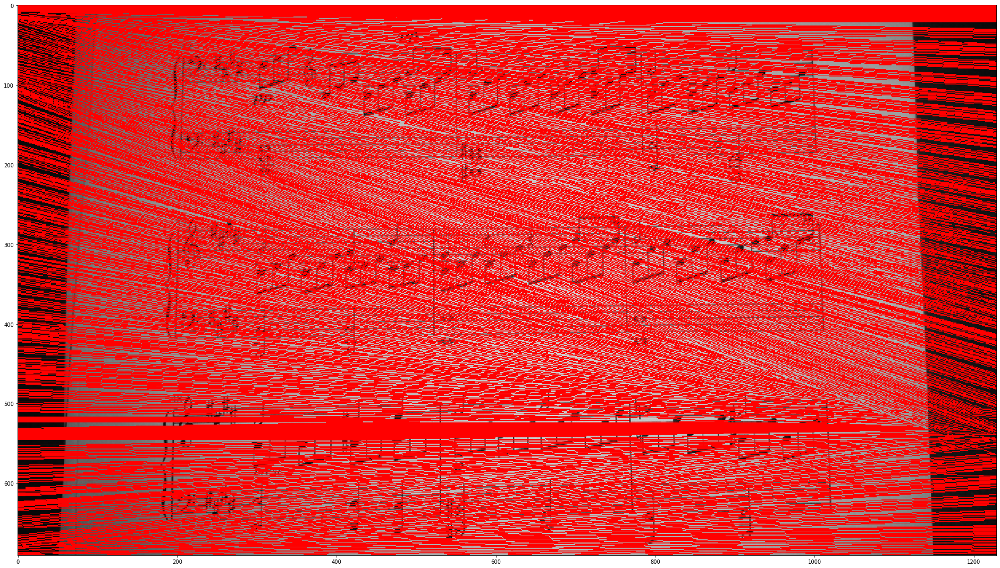

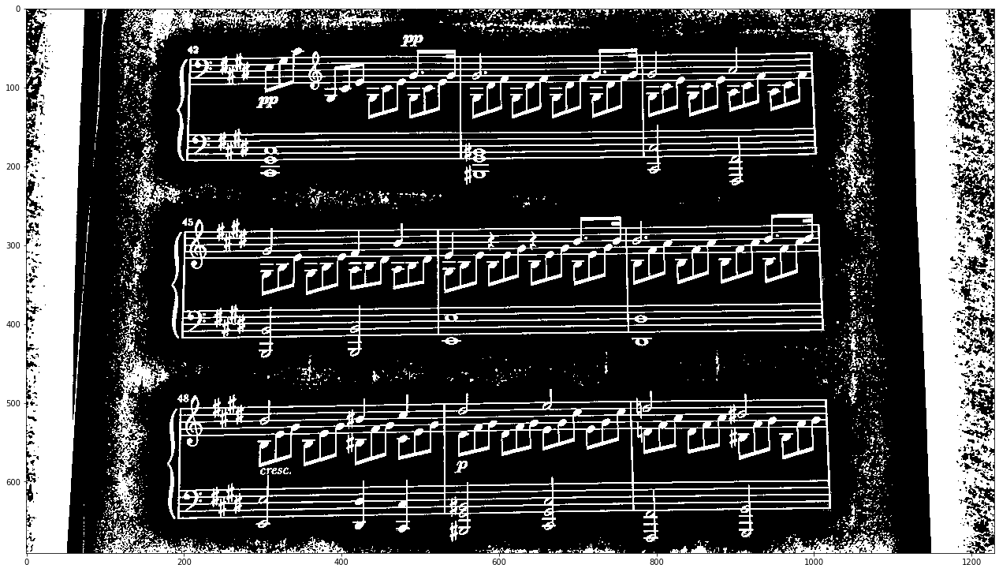

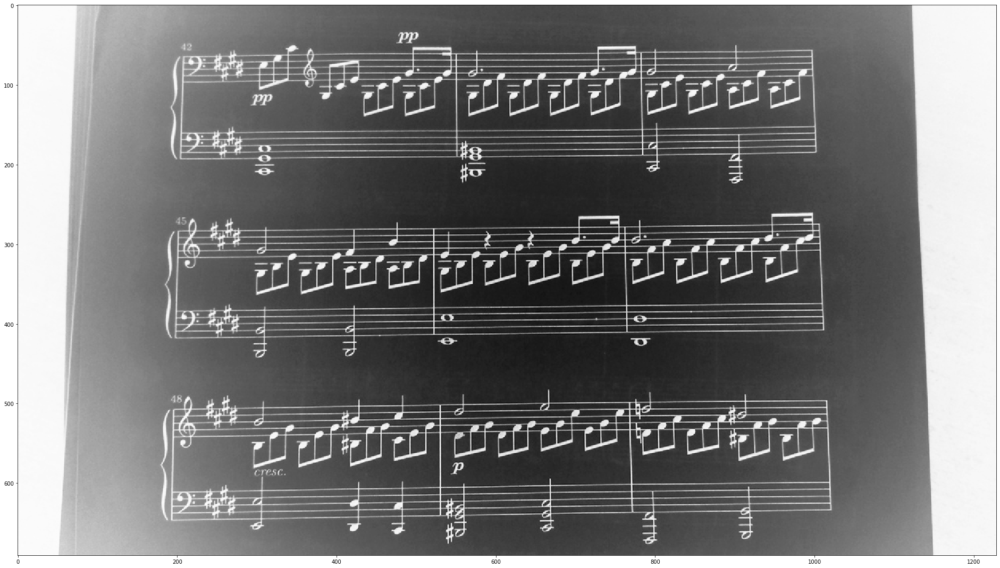

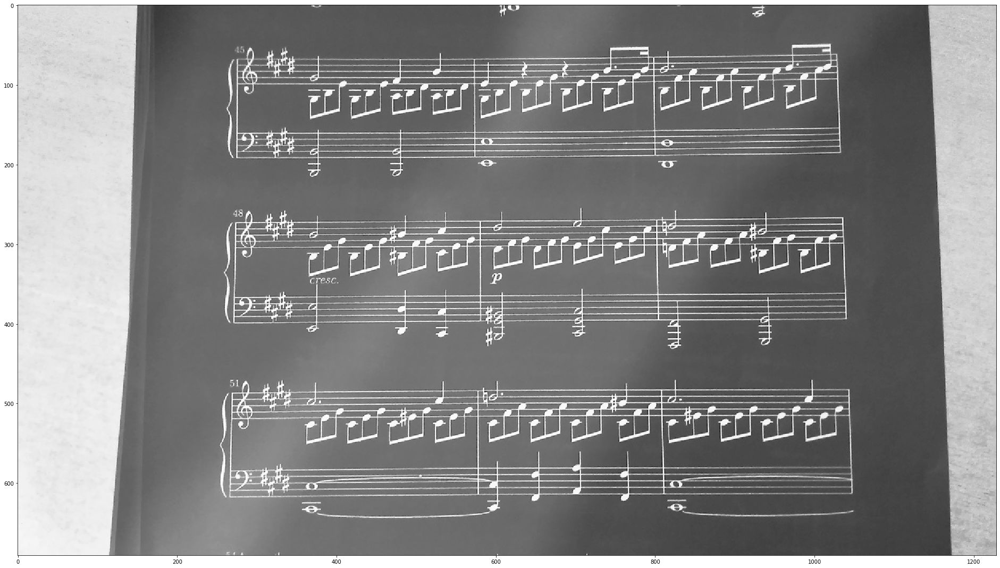

0.3247819400307277


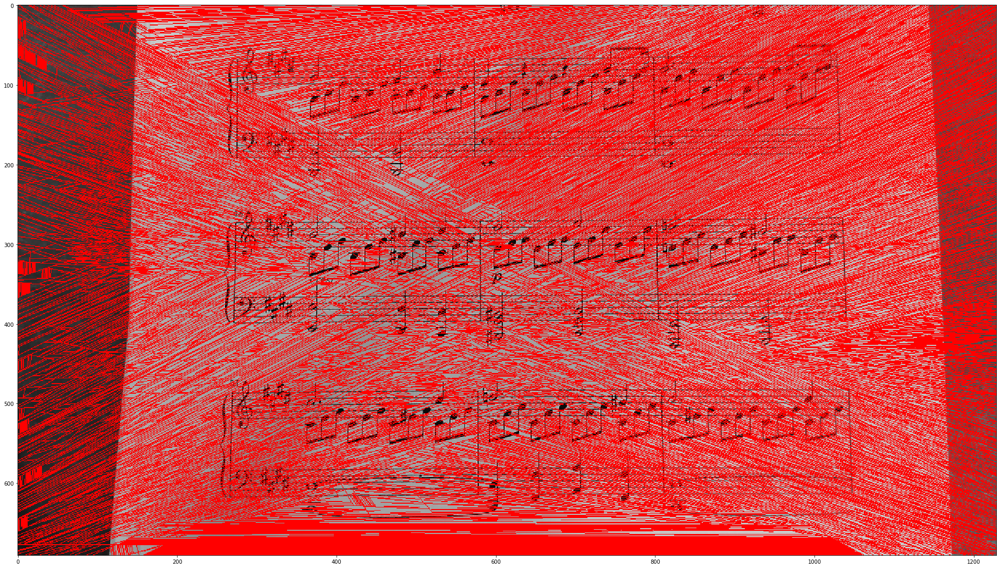

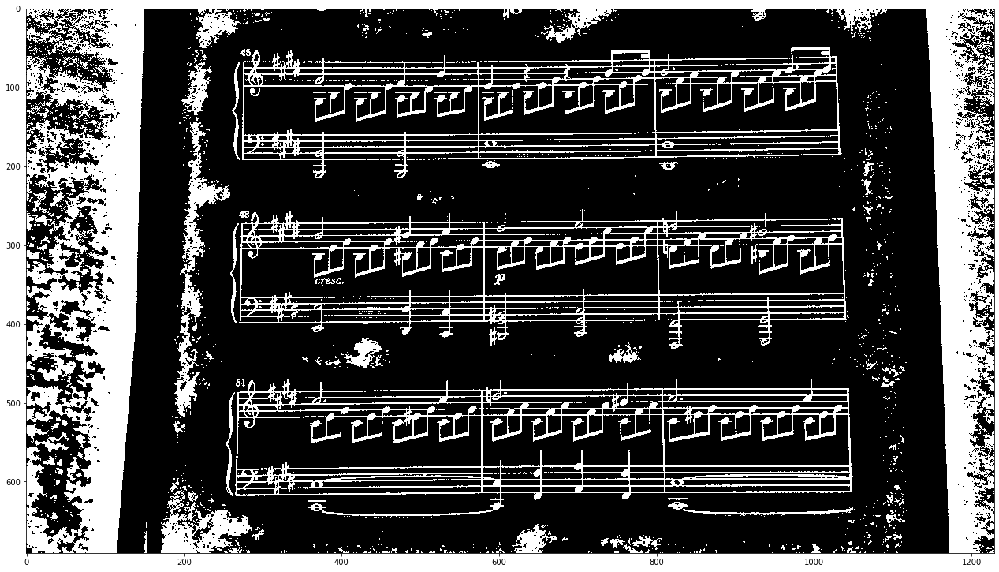

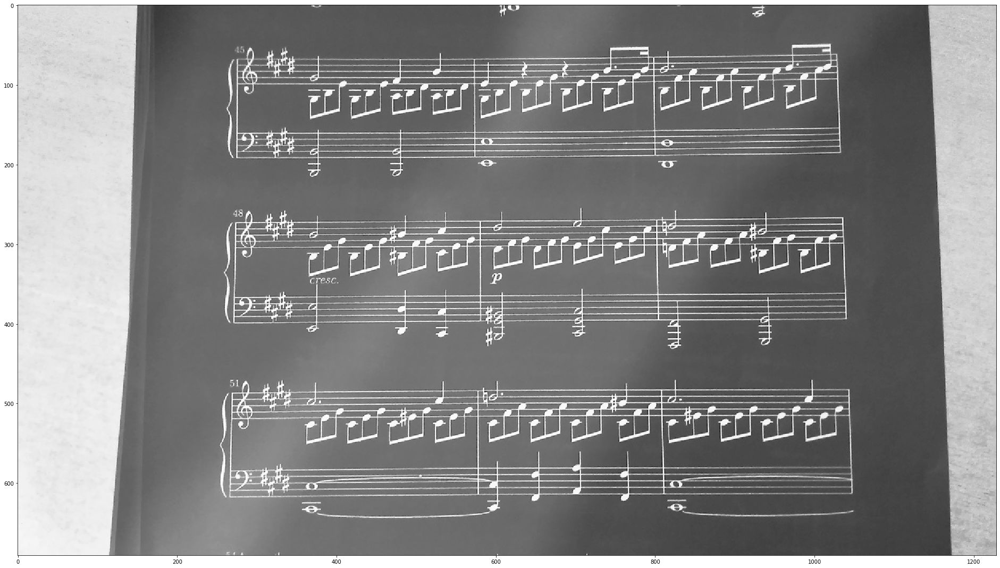

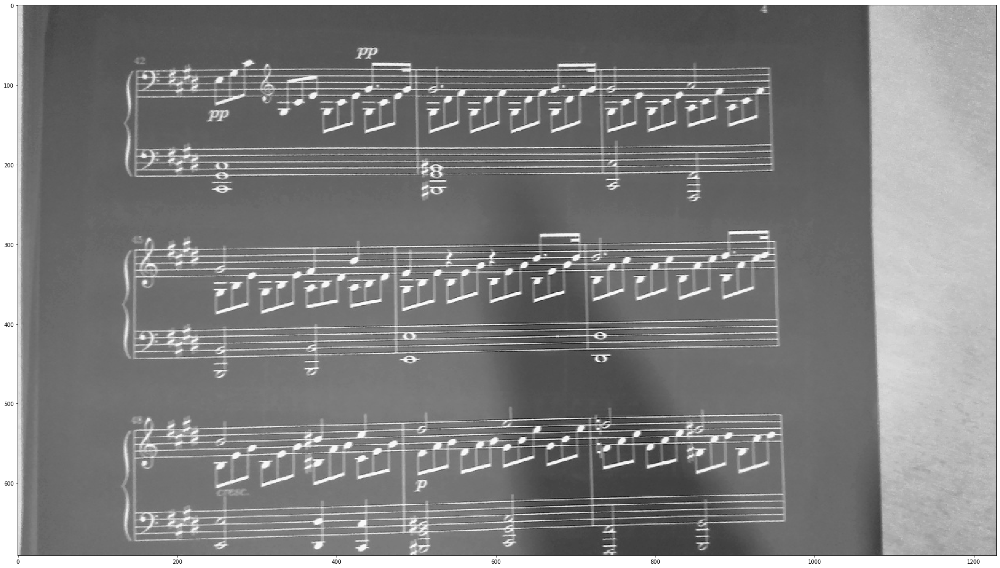

0.2348552599978566


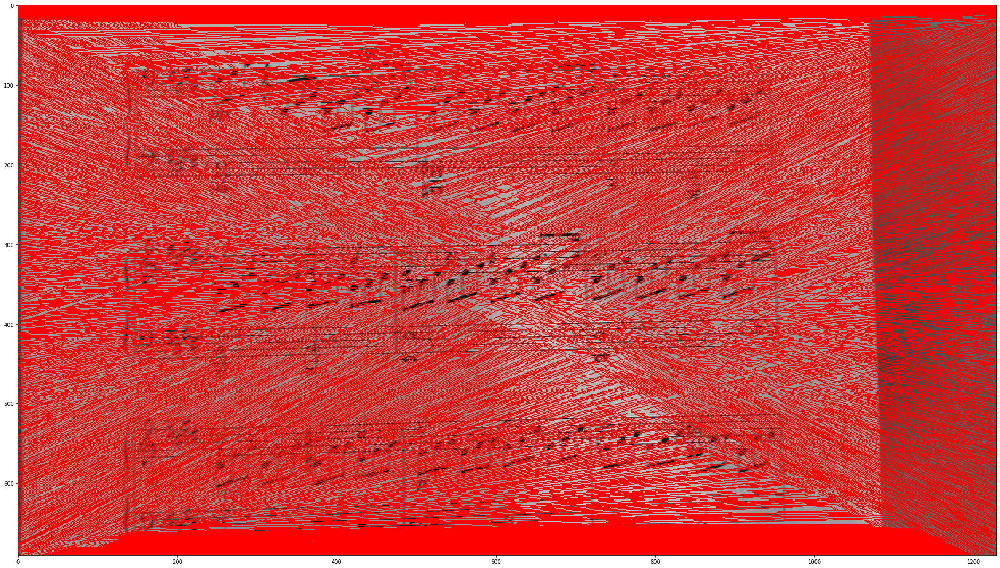

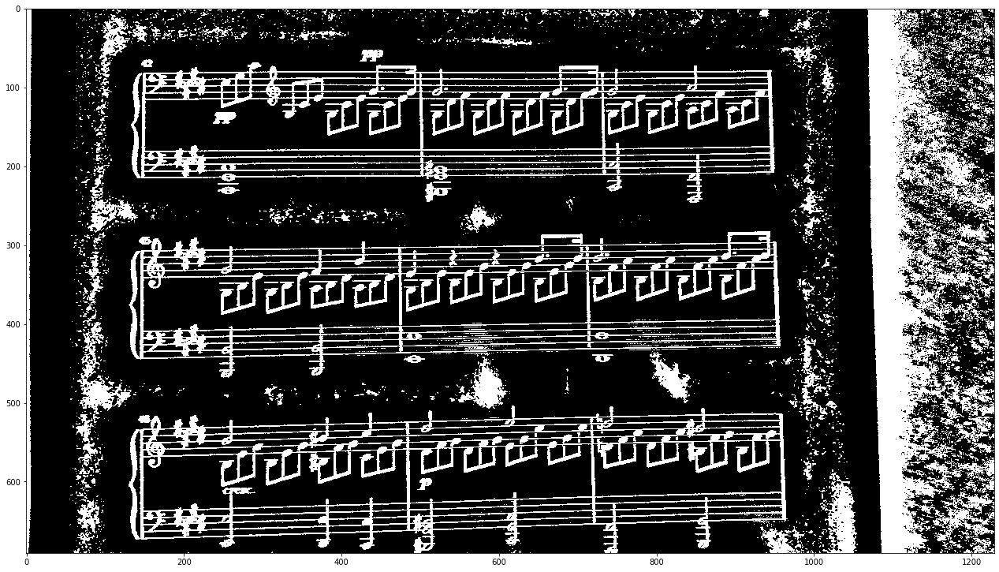

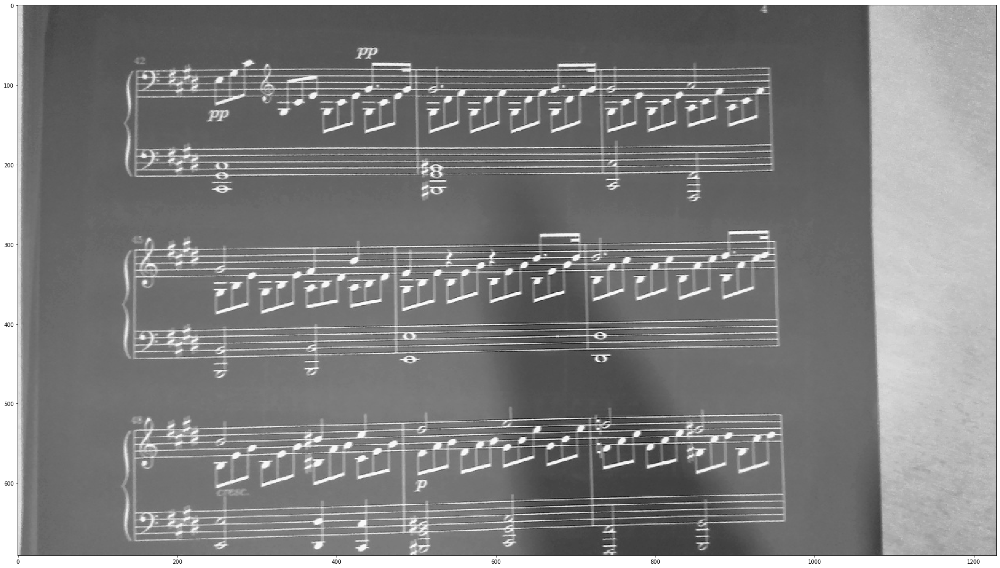

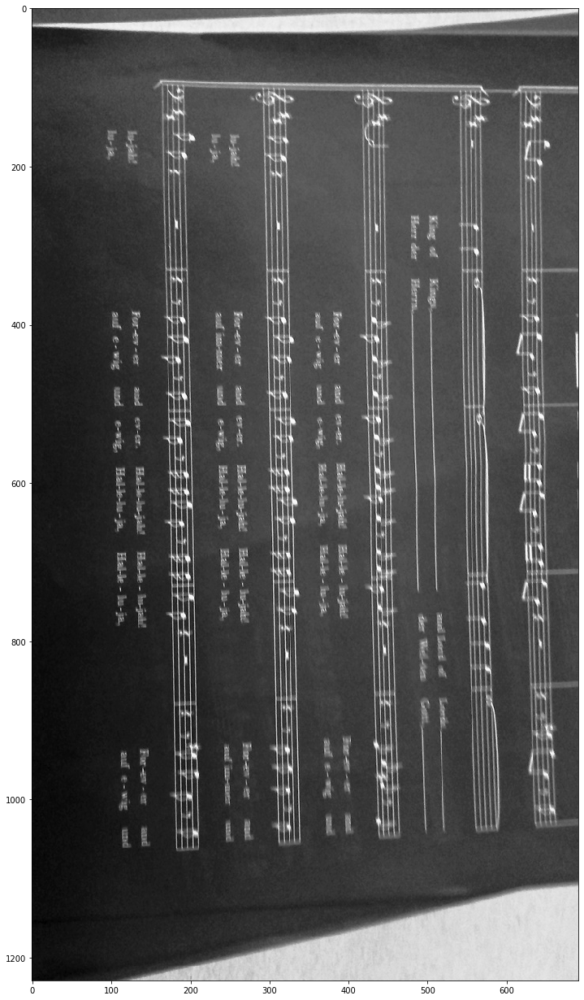

0.9545495857769094


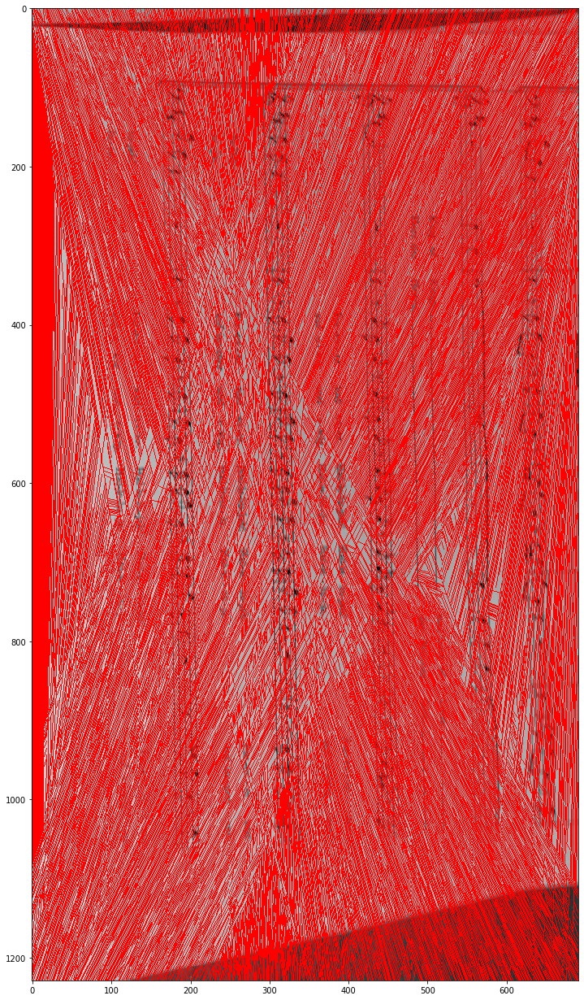

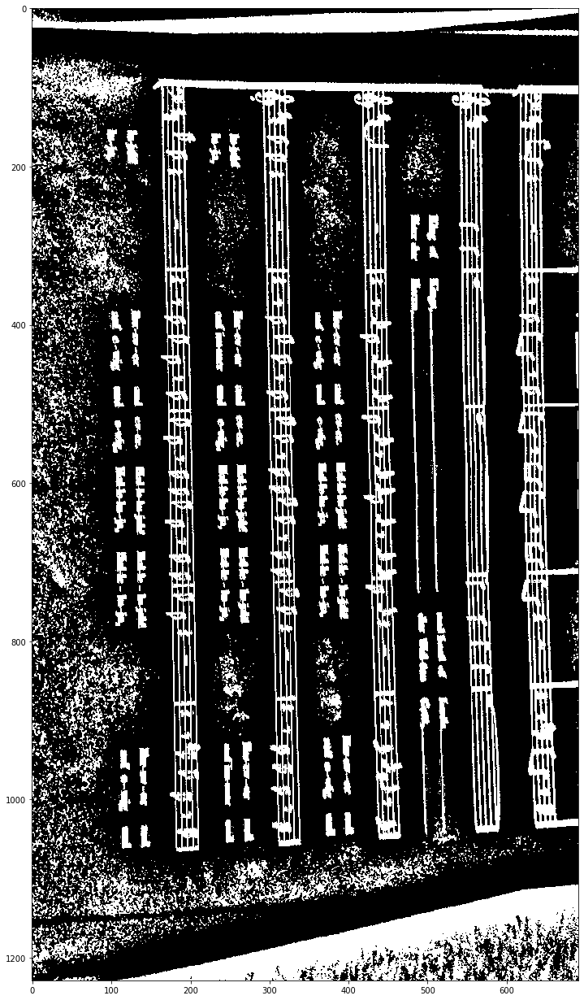

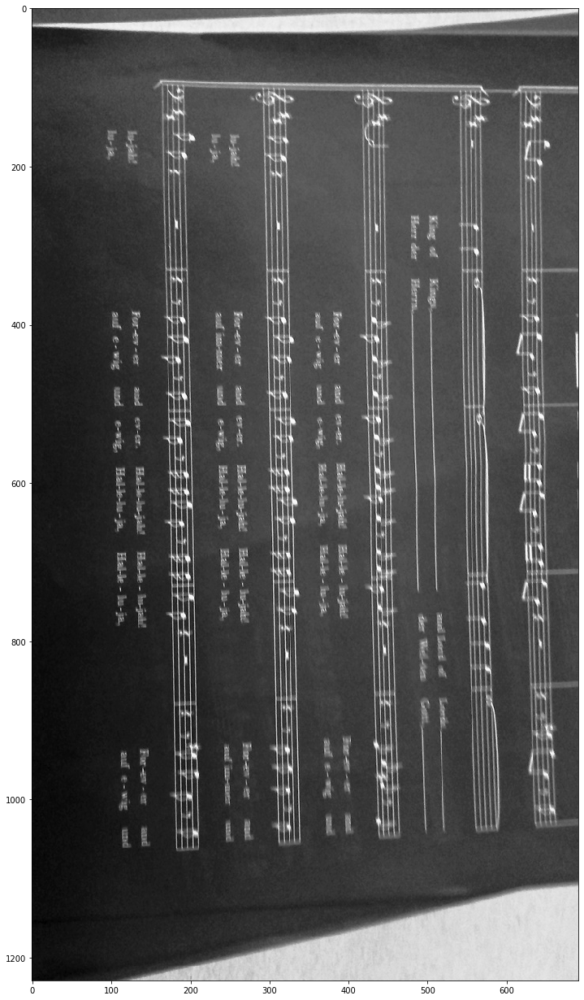

In [60]:
def binarization(bwimg):
    kernel=[0]*10
    #kernele do grafiki
    kernel[1]=np.asarray([[-1, -1, -1], [-1,8,-1], [-1, -1, -1]])
    kernel[2]=np.asarray([[0, 1, 0], [1,-4,1], [0, 1, 0]])
    kernel[3]=np.asarray([[0, 1, 0], [1,-5,1], [0, 1, 0]])
    kernel[4]=(1/9)*np.asarray([[1, 1, 1], [1,1,1], [1, 1, 1]])
    kernel[5]=(1/16)*np.asarray([[1, 2, 1], [2,4,2], [1, 2, 1]])
    kernel[6]=(1/256)*np.asarray([[1,4,6,4,1], [4,16,24,16,4], [6,24,36,24,6], [4,16,24,16,4], [1,4,6,4,1]])
    dm=(7,7)
    kernel[7]=np.asarray([[1 for j in range(dm[0])] for i in range(dm[1])])
    kernel[8]=np.asarray([[0, -1, 0], [-1,5,-1], [0, -1, 0]])
    
    mg2=cv.filter2D(bwimg, -1, kernel[4])
    im3=cv.filter2D(mg2, -1, kernel[1])
    im4=cv.filter2D(im3, -1, kernel[7])
    
    return cv.adaptiveThreshold(bwimg, 255, cv.ADAPTIVE_THRESH_GAUSSIAN_C, cv.THRESH_BINARY, 145, 1)

def blackening(bwimg, pathway_of_decay):
    s, t, gr=0, 0, 0
    for i in range(len(pathway_of_decay)):
        s1v=bwimg[pathway_of_decay[i][0]+3:pathway_of_decay[i][0]+8, pathway_of_decay[i][1]] if (pathway_of_decay[i][0]+7<bwimg.shape[0]) else 0
        s2v=bwimg[pathway_of_decay[i][0]-7:pathway_of_decay[i][0]-2, pathway_of_decay[i][1]] if (pathway_of_decay[i][0]-3>=0) else 0
        try:
            s1v=sum(s1v)//255
            s2v=sum(s2v)//255
        except:
            s1v=0
            s2v=0
        
        if (s1v>=4 and s2v>=4):
            t+=1
            for j in range(5):
                if (bwimg[pathway_of_decay[i][0]-2+j, pathway_of_decay[i][1]]==0):
                    s=s+j-2
                    gr+=1

            bwimg[pathway_of_decay[i][0], pathway_of_decay[i][1]]=255
            bwimg[pathway_of_decay[i][0]-1, pathway_of_decay[i][1]]=255
            bwimg[pathway_of_decay[i][0]+1, pathway_of_decay[i][1]]=255
            bwimg[pathway_of_decay[i][0]-2, pathway_of_decay[i][1]]=255
            bwimg[pathway_of_decay[i][0]+2, pathway_of_decay[i][1]]=255
        
    if (t>0):
        s=s/t
        gr=gr/t
    return (pathway_of_decay[i][0]+s, gr)
            
def pathfinder(bwimg, fals, dead, yla, ylc, x):
    slain=0
    im=bwimg[yla:ylc+1,x]
    if (len(im)==2):
        print(yla, ylc, im, bwimg.shape)
    
    if (im[1]==255 and (im[0]==0 or im[2]==0)):
        fals+=1
        dead=0
    elif(im[1]==255):
        dead+=1
    else:
        fals, dead=0, 0
    
    if (fals==3):
        fals=0
        if (im[0]==0):
            yla, ylc=yla-1, ylc-1
        else:
            yla, ylc=yla+1, ylc+1
    if (dead==8):
        dead=0
        slain=1
    return(fals, dead, slain, yla, ylc)
    
def findlinez(bwimg):
    y=1
    x1=bwimg.shape[1]//2-2
    x2=bwimg.shape[1]//2+2
    solution=[]
    
    while (y<bwimg.shape[0]-1):
        vs=bwimg[y,x1:x2+1]
        if (0 in vs):
            xl=bwimg.shape[1]//2
            yla, ylc=y-1, y+1
            xr=xl
            
            pathway=[]
            fals, dead, slain=0, 0, 0
            while (xl>0):
                fals, dead, slain, yla, ylc=pathfinder(bwimg, fals, dead, yla, ylc, xl)
                pathway.append((yla+1, xl))
                if (slain==1 or yla==-1 or ylc>=bwimg.shape[0]):
                    break
                xl-=1
            
            fals, dead, slain=0, 0, 0
            yla, ylc=y-1, y+1
            while (xr<bwimg.shape[1]):
                fals, dead, slain, yla, ylc=pathfinder(bwimg, fals, dead, yla, ylc, xr)
                pathway.append((yla+1, xr))
                if (slain==1 or yla==-1 or ylc>=bwimg.shape[0]):
                    break
                xr+=1
            if (xr-xl>bwimg.shape[1]*0.5):
                sv, gr=blackening(bwimg, pathway)
                solution.append((sv, gr, xl, xr))
                
        y+=1
    return solution

def rotate_image(img, angle):
    minLineLength = 200
    maxLineGap = 10
    
    kern=(1/256)*np.asarray([[1,4,6,4,1], [4,16,24,16,4], [6,24,36,24,6], [4,16,24,16,4], [1,4,6,4,1]])
    
    
    lines = cv.HoughLinesP(img,1,np.pi/180,100,minLineLength,maxLineGap)

    cosa=[0]*len(lines)
    for i, iv in enumerate(lines):
        x1,y1,x2,y2=iv[0]
        fx, fy=x1, y1
        dx, dy=(x2-x1), (y2-y1)

        cosa[i]=abs(dy)/math.sqrt(dy*dy+dx*dx)    
        #cv.line(img,(x1,y1),(x2,y2),(255,0,0),1)

    cosa=sorted(cosa)
    i=math.floor(0.4*len(cosa))
    n=math.ceil(0.6*len(cosa))
    x=np.mean(cosa[i:n])
    print(x)
    #angle=-90+math.acos(x)*(180/math.pi)
    angle=0
    
    h, w = img.shape[:2]
    image_center = (w/2, h/2)

    rotation_mat = cv.getRotationMatrix2D(image_center, angle, 1)

    radians = math.radians(angle)
    sin = math.sin(radians)
    cos = math.cos(radians)
    bound_w = int((h*abs(sin)) + (w*abs(cos)))
    bound_h = int((h*abs(cos)) + (w*abs(sin)))

    rotation_mat[0, 2] += ((bound_w / 2) - image_center[0])
    rotation_mat[1, 2] += ((bound_h / 2) - image_center[1])

    rotated_mat = cv.warpAffine(img, rotation_mat, (bound_w, bound_h), borderValue=255)
    kgbo=np.zeros((rotated_mat.shape[0], rotated_mat.shape[1], 3), dtype='uint8')
    kgbo[:,:,0]=rotated_mat
    kgbo[:,:,1]=rotated_mat
    kgbo[:,:,2]=rotated_mat    
        
    for i, iv in enumerate(lines):
        x1,y1,x2,y2=iv[0]
        fx, fy=x1, y1
        dx, dy=(x2-x1), (y2-y1)

        cosa[i]=abs(dy)/math.sqrt(dy*dy+dx*dx)    
        cv.line(kgbo,(x1,y1),(x2,y2),(255,0,0),1)
        
    fig, ax=plt.subplots(1,1,figsize=(33,22))    
    ax.imshow(kgbo)
    plt.show()
    
    return rotated_mat 

for i in range(5):
    imgb=f[i].copy()
    
    fig, ax=plt.subplots(1,1,figsize=(33,22))    
    ax.imshow(imgb, cmap='Greys',  interpolation='nearest')
    plt.show()
    imv=rotate_image(imgb, 30)
    
    ###BINARIZATION
    img2=binarization(imv)   
    fig, ax=plt.subplots(1,1,figsize=(22,22))    
    ax.imshow(img2, cmap='Greys',  interpolation='nearest')
    plt.show()
    
    ###Linez - Only horizontal hier - to będzie później
    #imv=rotate_image(img2, 30)
    
    
    fig, ax=plt.subplots(1,1,figsize=(33,22))    
    ax.imshow(imv, cmap='Greys',  interpolation='nearest')
    plt.show()
    ##
    ##
    
    
    
    """
    
    fig, ax=plt.subplots(1,1,figsize=(22,22))    
    ax.imshow(img2, cmap='Greys',  interpolation='nearest')
    plt.show()
    
    ###DETECTION
    fig, ax=plt.subplots(1,1,figsize=(22,22))
    sol=findlinez(img2)
    #sol - lista tupli - 1-wszy to uśrednione miejsce linii pięciolinii, 2-gi to grubość linii
    print('kolejno: wysokość wiersza, grubość wiersza, kolumna od lewej: początek, koniec')
    for x in sol:
        ax.axhline(x[0], color=(1,0,0))
        print(x)
    print('liczba liń z pięcioliń: {} (jak podzielna przez 5 to pewnie się zgadza)'.format(len(sol)))
        
    ax.imshow(img2, cmap='Greys',  interpolation='nearest')
    plt.show()
    
    fig, ax=plt.subplots(1,1,figsize=(22,22))    
    ax.imshow(img2, cmap='Greys',  interpolation='nearest')
    plt.show()
    
    """

In [ ]:
#### 

In [ ]:
###Śmieci do recyklingu



##Bardzo efektywny do pdfów
kernel=[0]*10
#kernele do grafiki
kernel[1]=np.asarray([[-1, -1, -1], [-1,8,-1], [-1, -1, -1]])
kernel[2]=np.asarray([[0, 1, 0], [1,-4,1], [0, 1, 0]])
kernel[3]=np.asarray([[0, 1, 0], [1,-5,1], [0, 1, 0]])
kernel[4]=(1/9)*np.asarray([[1, 1, 1], [1,1,1], [1, 1, 1]])
kernel[5]=(1/16)*np.asarray([[1, 2, 1], [2,4,2], [1, 2, 1]])
kernel[6]=(1/256)*np.asarray([[1,4,6,4,1], [4,16,24,16,4], [6,24,36,24,6], [4,16,24,16,4], [1,4,6,4,1]])
dm=(7,7)
kernel[7]=np.asarray([[1 for j in range(dm[0])] for i in range(dm[1])])
kernel[8]=np.asarray([[0, -1, 0], [-1,5,-1], [0, -1, 0]])


for i in range(j):
    img=f[i].copy()
    grayscaled = cv.cvtColor(img,cv.COLOR_BGR2GRAY)
    img2=cv.adaptiveThreshold(grayscaled, 255, cv.ADAPTIVE_THRESH_GAUSSIAN_C, cv.THRESH_BINARY, 35, 1)
    grave(img2)
    grave(img)
    
    
    
    
#To idzie do lamusa
def detect_5(bwimg):
    cs=0
    jj=0
    bethon=[0]*1000
    x=0
    cdis=80
    v1, v2=10, cdis+10
    
    while (x<len(bwimg)-v1):
        svv=((255-bwimg[x:x+cdis,:])//255).astype('int32')
        svg=(sorted(np.sum(svv, axis=1), reverse=1))
        stv=zip(range(x, x+cdis), np.sum(svv, axis=1))
        stv=(sorted(stv, key=lambda x:x[1], reverse=1))
        
        svv2=((255-bwimg[x+v1:x+v2,:])//255).astype('int32')
        svg2=(sorted(np.sum(svv2, axis=1), reverse=1))
        stv2=zip(range(x+v1, x+v2), np.sum(svv2, axis=1))
        stv2=(sorted(stv2, key=lambda x:x[1], reverse=1))
        
        #Ta heura na razie jest koszmarna i nieuniwersalizowalna, choć idea pewnie dobra
        if (len(svg2)>5 and svg[4]==svg2[4] and svg[4]>0.6*bwimg.shape[1] and distinct(stv)==1):
            bethon[jj]=(x+5, x+cdis+5, stv2[:15])
            jj+=1
            x+=cdis
        else:
            x+=1
    return (bethon[:jj])


#Bierze imidż zarotowany równolegle do górnej krawędzi obrazka
def distinct(arr):
    st=sorted(arr, key=lambda x:x[0])
    j=0
    dist=1
    while (j<len(arr)):
        if (0.8*arr[0][1]>arr[j][1]):
            break
        if (j>0 and arr[j][0]-arr[j-1][0]>3):
            dist+=1
        j+=1
    return (1 if dist>=5 else 0)